In [12]:
import os;
import pandas as pd;

from prophet import Prophet;
from prophet.plot import add_changepoints_to_plot;
from sklearn.metrics import mean_absolute_error;
from tqdm.notebook import tqdm;
from logging import getLogger, NullHandler, CRITICAL;

log = getLogger('cmdstanpy');
log.addHandler(NullHandler());
log.setLevel(CRITICAL);
log.propagate = False;

for dirname, _, filenames in os.walk('/home/jovyan/work/datasets/alfamipt-2023-atm-cash-prediction'):
    for filename in filenames:
        print(os.path.join(dirname, filename));

/home/jovyan/work/datasets/alfamipt-2023-atm-cash-prediction/submission-01.csv
/home/jovyan/work/datasets/alfamipt-2023-atm-cash-prediction/train.csv
/home/jovyan/work/datasets/alfamipt-2023-atm-cash-prediction/sample_submition.csv
/home/jovyan/work/datasets/alfamipt-2023-atm-cash-prediction/test.csv
/home/jovyan/work/datasets/alfamipt-2023-atm-cash-prediction/.ipynb_checkpoints/sample_submition-checkpoint.csv
/home/jovyan/work/datasets/alfamipt-2023-atm-cash-prediction/.ipynb_checkpoints/submission-01-checkpoint.csv


In [13]:
PREDICTION_DAYS = 14;

df_train = pd.read_csv('/home/jovyan/work/datasets/alfamipt-2023-atm-cash-prediction/train.csv');
df_test = pd.read_csv('/home/jovyan/work/datasets/alfamipt-2023-atm-cash-prediction/test.csv');

df_train = df_train.sort_values(by=['atm_id', 'value_day']);
df_test = df_test.sort_values(by=['atm_id', 'value_day']);

df_train.rename(columns={'value_day': 'ds', 'target': 'y'}, inplace=True);
df_test.rename(columns={'value_day': 'ds', 'target': 'y'}, inplace=True);

df_train['ds'] = pd.to_datetime(df_train['ds']);
df_test['ds'] = pd.to_datetime(df_test['ds']);

In [14]:
display('Unique ATMs in train set:', df_train['atm_id'].nunique());
display('Unique ATMs in test set:', df_test['atm_id'].nunique());

predict_since = df_test[df_test['y'].isna()].drop_duplicates(subset='atm_id'); #.head();

display('Prediction start dates (head):', predict_since.head(), len(predict_since));

'Unique ATMs in train set:'

650

'Unique ATMs in test set:'

120

'Prediction start dates (head):'

,atm_id,ds,y
38496,014f3069d0f91c1a8eac41e67375b829,2021-11-23,NaN
365,025256f6559d0d57033556e87efbe1b1,2021-12-01,NaN
38869,02d4a43c8973a89a0f9ce5426643d7f2,2021-10-10,NaN
39569,03eac676110c26e9d4f383b9d846854b,2021-11-17,NaN
1074,05f64163221bffeb4d5fd3db01322ba5,2021-11-26,NaN


120

In [17]:
def train(df, fixed_period=True):
    models = {};
    for atm_id in tqdm(df['atm_id'].unique()):
        try:
            atm_data = df[df['atm_id'] == atm_id].copy();
            model = Prophet();
            dataset = atm_data.iloc[0:-PREDICTION_DAYS] if fixed_period else atm_data[~atm_data['y'].isna()];
            model.fit(dataset);
        except Exception as e:
            display(atm_id, e);
        models[atm_id] = model;
    return models;

def predict(df, models):
    forecast = [];
    for atm_id in tqdm(df['atm_id'].unique()):
        model = models[atm_id];
        future_df = model.make_future_dataframe(periods=PREDICTION_DAYS, include_history=False);
        prediction = model.predict(future_df);
        prediction['atm_id'] = atm_id;
        forecast.append(prediction);
        figure = model.plot(prediction);
        a = add_changepoints_to_plot(figure.gca(), model, prediction);
    return pd.concat(forecast, axis=0);

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/prophet/plot.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(facecolor='w', figsize=figsize)


## Train dataset mean absolute error:


1548708.4043966695

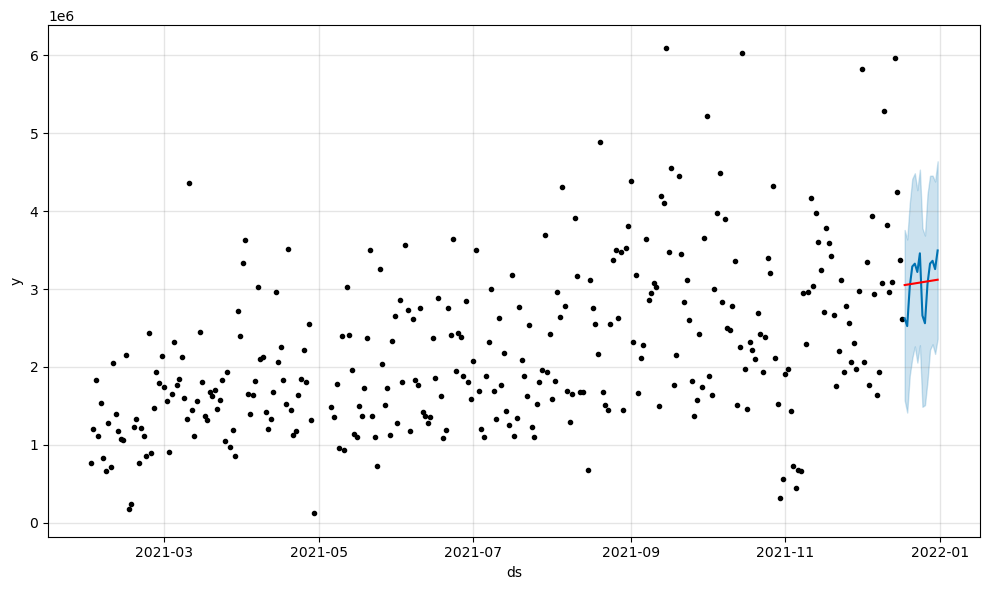

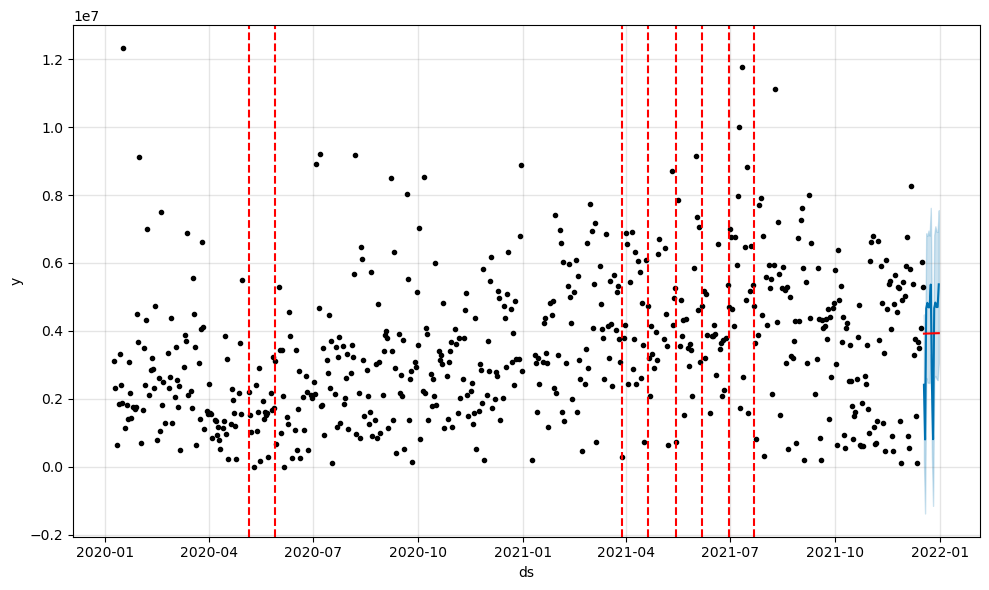

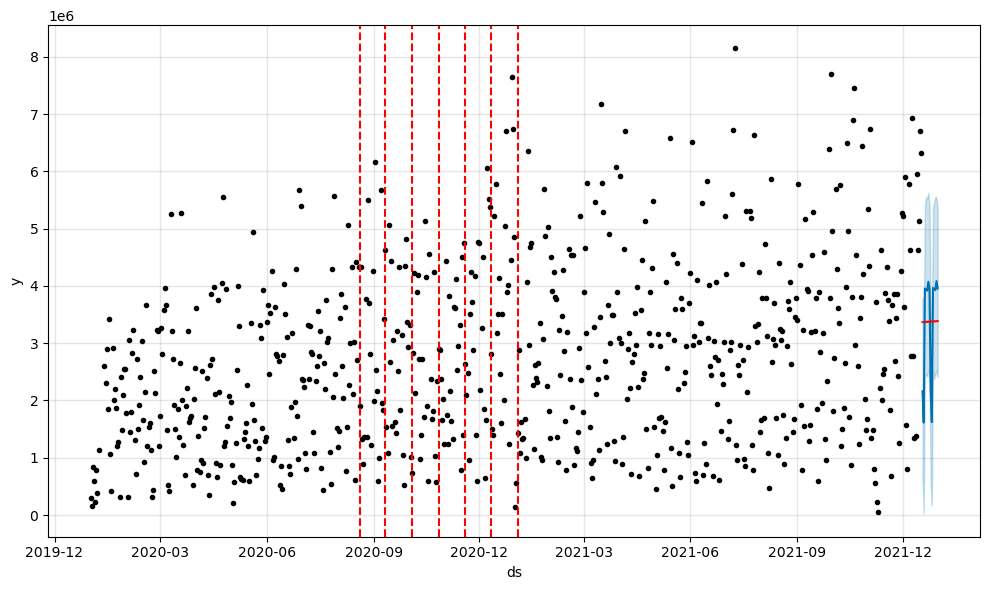

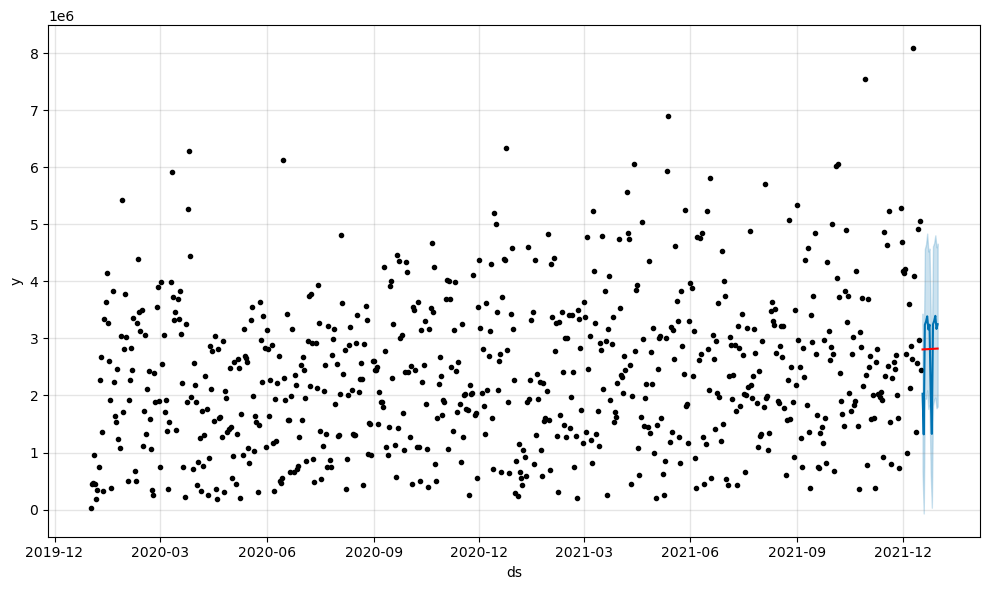

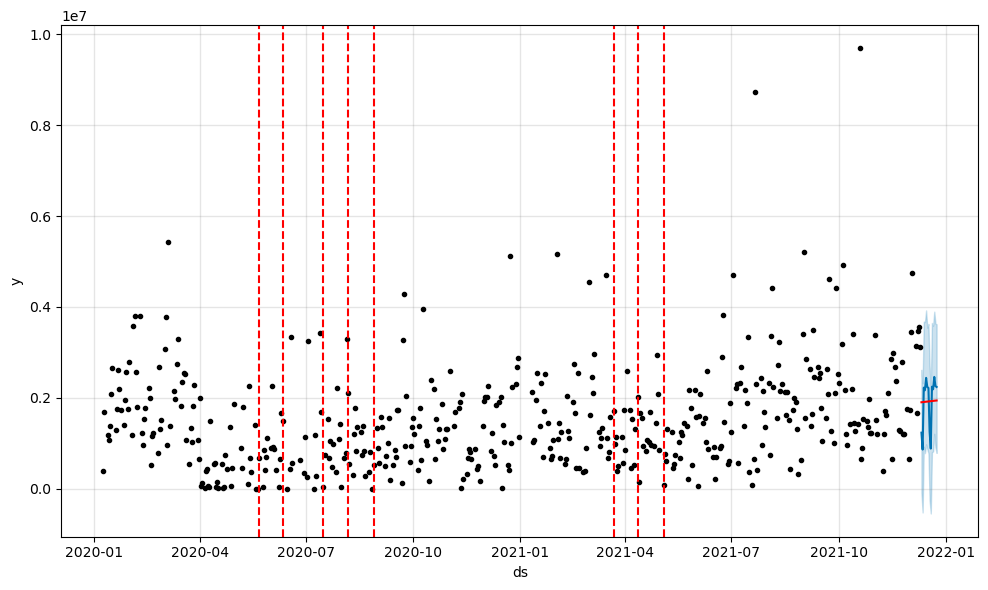

...

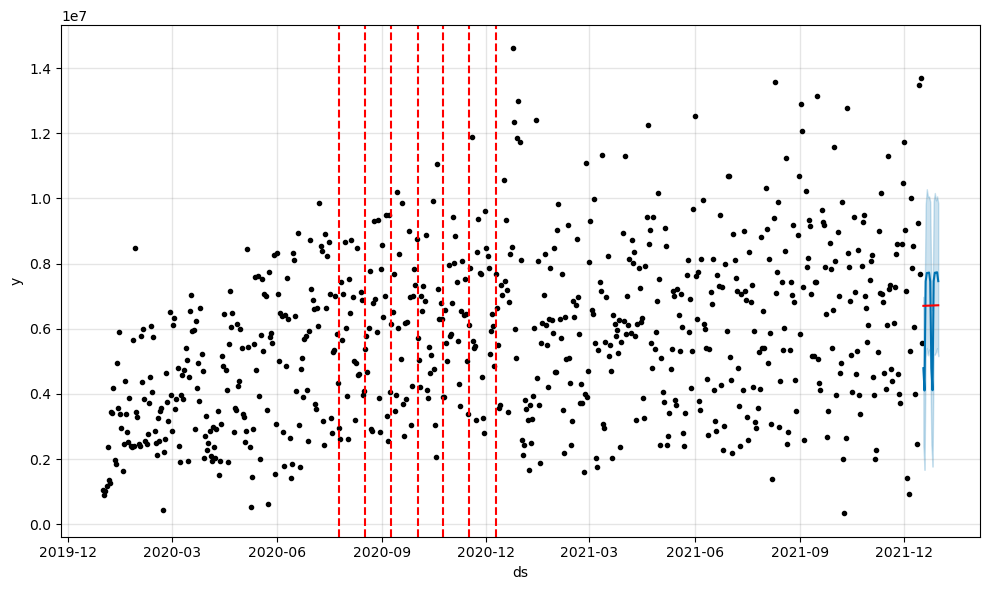

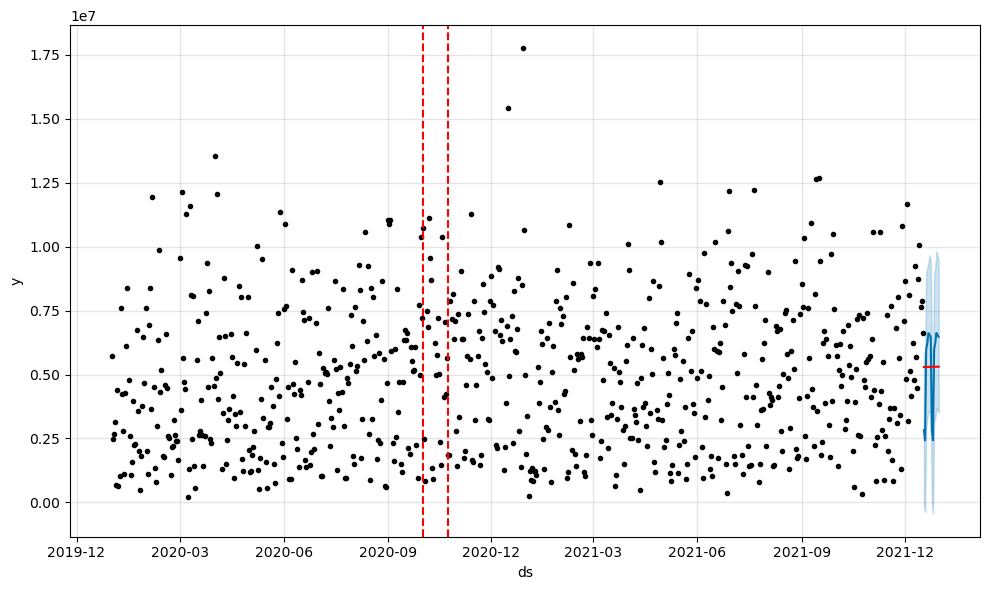

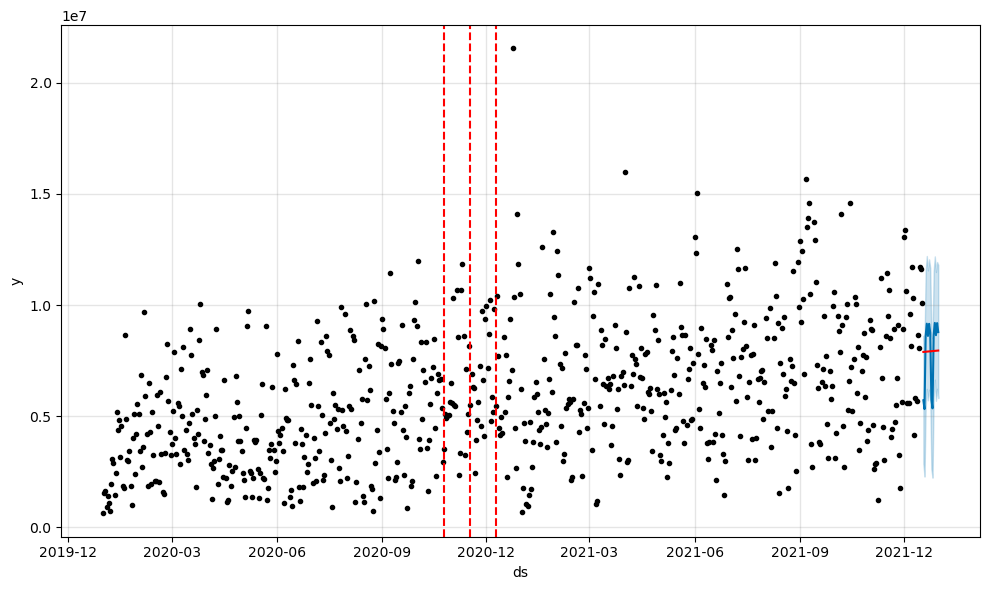

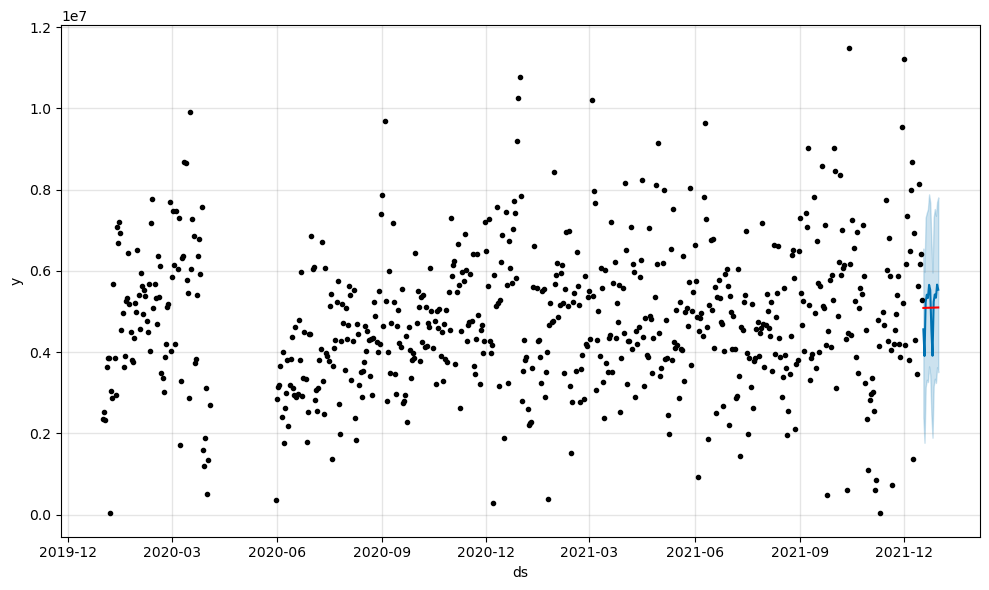

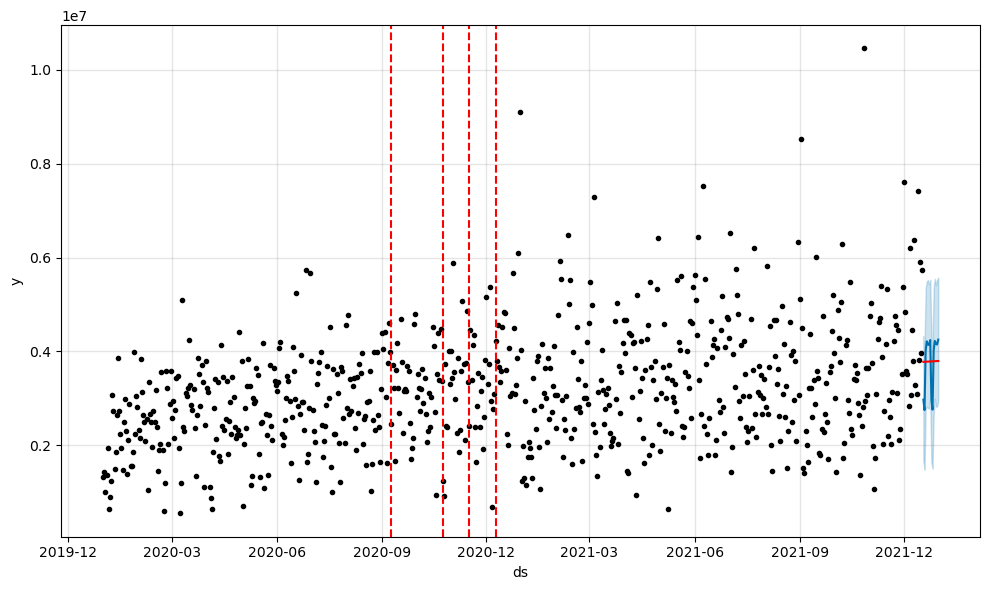

In [18]:
sample = df_train['atm_id'].unique()[:200];
df_train_sample = df_train[df_train['atm_id'].isin(sample)];
models_train_sample = train(df_train_sample);

forecast_train_sample = pd.merge(
    predict(df_train_sample, models_train_sample),
    df_train_sample,
    on=['atm_id', 'ds']);

print('## Train dataset mean absolute error:');
display(mean_absolute_error(forecast_train_sample['y'], forecast_train_sample['yhat']));

In [10]:
atm_ids = df_test['atm_id'].unique();
models_test = train(df_test, fixed_period=False);
forecast_test = predict(df_test, models_test);

forecast_test['atm_id'] = forecast_test['atm_id'] + '_' + (
    forecast_test.groupby(['atm_id']).cumcount() + 1).astype(str);

  0%|          | 0/120 [00:00<?, ?it/s]

  0%|          | 0/120 [00:00<?, ?it/s]

In [11]:
forecast_test[['atm_id', 'yhat']].to_csv(
    '/home/jovyan/work/datasets/alfamipt-2023-atm-cash-prediction/submission-01.csv', index=None);